# Full Team Player Recognition Dino Backbone

In [1]:
import os
print(os.listdir('/pfs/data6/home/st/st_us-053000/st_st195720/Object_Segmentation_NFL/Team_masks2/all_masks')[:10])
path = "/pfs/data6/home/st/st_us-053000/st_st195720/"

['58162_000514_Sideline_frame45_jpg.rf.d4f1cf868bfc4f79d9460cdd0fd9ea00.jpg_team_mask.png', '57549_002523_Sideline_frame152_jpg.rf.6337d003e10769148c54fa4cf216b5db.jpg_team_mask.png', '57735_000430_Sideline_frame72_jpg.rf.230263c13f5cc94278acf2f2b10326df.jpg_team_mask.png', 'Capture160_PNG_jpg.rf.1afd4acd42b3ab2f001b615eee547b67.jpg_team_mask.png', 'Capture171_PNG_jpg.rf.1c9b3a01932b8704e1434e186ba38c2d.jpg_team_mask.png', 'Capture30_PNG_jpg.rf.0eb0d8468bdde798bfb071e55f2edd38.jpg_team_mask.png', 'Capture133_PNG_jpg.rf.63cec0aa3d56ada99c05bf660c26fb89.jpg_team_mask.png', 'Capture15_PNG_jpg.rf.5ce57ca464b16eeb9bb5ca130b3db269.jpg_team_mask.png', 'Capture237_PNG_jpg.rf.9a315b7ce4ac01c029596a66cc181c58.jpg_team_mask.png', 'Capture82_PNG_jpg.rf.156214274516bbad9c4c133f3770397e.jpg_team_mask.png']


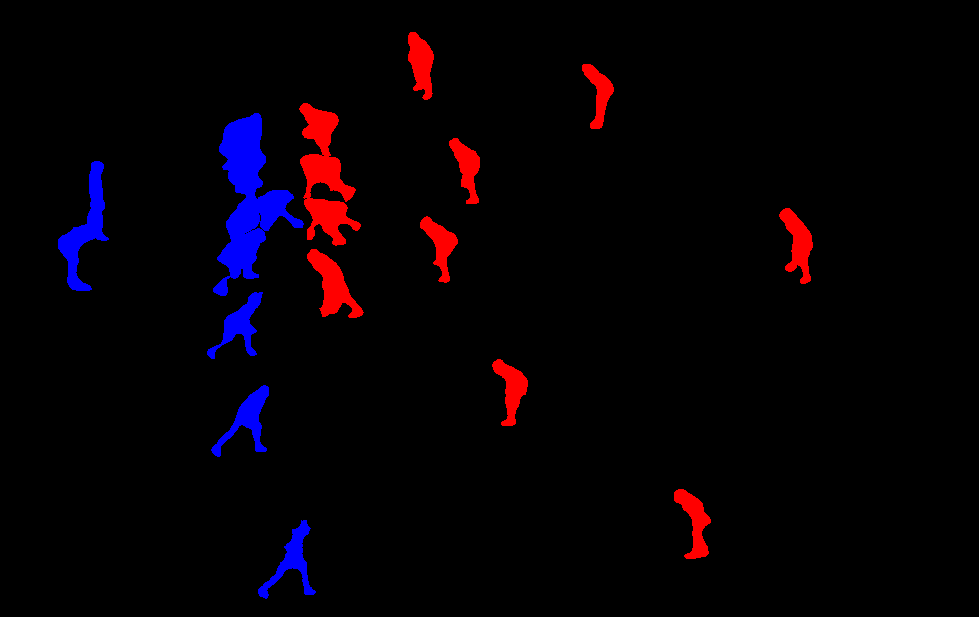

In [11]:
Image.open((path + 'Object_Segmentation_NFL/Team_masks2/all_masks/1_PNG_jpg.rf.28823f1ac451db7398ceafc144d00486.jpg_team_mask.png'))

In [7]:
torch.cuda.is_available()

True

In [6]:
# ======================================================
IMG_DIR = "/pfs/data6/home/st/st_us-053000/st_st195720/Object_Segmentation_NFL/Team_masks2/images"
MASK_DIR = "/pfs/data6/home/st/st_us-053000/st_st195720/Object_Segmentation_NFL/Team_masks2/all_masks"

In [5]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np

from PIL import Image
from torch.utils.data import Dataset, DataLoader
from transformers import Dinov2Model
from tqdm import tqdm
from torch.utils.data import random_split
import matplotlib.pyplot as plt

In [19]:
import os
import random
import numpy as np
import torch
from torch.utils.data import Dataset
from PIL import Image
import torchvision.transforms.functional as TF

class NFLSegmentationDataset(Dataset):
    def __init__(self, img_dir, mask_dir, img_size=512, augment=False):
        self.img_dir = img_dir
        self.mask_dir = mask_dir
        self.img_size = img_size
        self.augment = augment

        self.samples = [
            (f, f + "_team_mask.png")
            for f in sorted(os.listdir(img_dir))
            if not f.startswith(".")
            and os.path.exists(os.path.join(mask_dir, f + "_team_mask.png"))
        ]

        print(f"Found {len(self.samples)} samples")

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_name, mask_name = self.samples[idx]

        image = Image.open(os.path.join(self.img_dir, img_name)).convert("RGB")
        mask  = Image.open(os.path.join(self.mask_dir, mask_name)).convert("L")

        image = image.resize((self.img_size, self.img_size), Image.BILINEAR)
        mask  = mask.resize((self.img_size, self.img_size), Image.NEAREST)

        # ─── SAFE PHOTOMETRIC AUGMENTATION (NO GEOMETRY CHANGE) ───
        if self.augment:
            # Brightness
            if random.random() < 0.7:
                factor = 0.7 + 0.6 * random.random()  # [0.7, 1.3]
                image = TF.adjust_brightness(image, factor)

            # Contrast
            if random.random() < 0.7:
                factor = 0.7 + 0.6 * random.random()
                image = TF.adjust_contrast(image, factor)

            # Gamma
            if random.random() < 0.5:
                gamma = 0.8 + 0.4 * random.random()  # [0.8, 1.2]
                image = TF.adjust_gamma(image, gamma)

            # Gaussian noise
            if random.random() < 0.4:
                img_np = np.array(image).astype(np.float32)
                noise = np.random.normal(0, 6, img_np.shape)
                img_np = np.clip(img_np + noise, 0, 255)
                image = Image.fromarray(img_np.astype(np.uint8))

        image = torch.from_numpy(np.array(image)).permute(2, 0, 1).float() / 255.0

        mask_np = np.array(mask)
        mask = torch.from_numpy((mask_np > 0).astype(np.int64))

        return image, mask

        
class RepeatDataset(torch.utils.data.Dataset):
    def __init__(self, dataset, repeats=3):
        self.dataset = dataset
        self.repeats = repeats

    def __len__(self):
        return len(self.dataset) * self.repeats

    def __getitem__(self, idx):
        return self.dataset[idx % len(self.dataset)]

In [5]:
# 1. base dataset (no aug)
base_dataset = NFLSegmentationDataset(
    IMG_DIR, MASK_DIR, img_size=384, augment=False
)

# 2. split
N = len(base_dataset)
train_size = int(0.7 * N)
val_size   = int(0.15 * N)
test_size  = N - train_size - val_size

train_set, val_set, test_set = random_split(
    base_dataset,
    [train_size, val_size, test_size],
    generator=torch.Generator().manual_seed(42)
)

# 3. augmentation only for training
train_set.dataset.augment = True
val_set.dataset.augment   = False
test_set.dataset.augment  = False

# 4. repeat only training
train_dataset = RepeatDataset(train_set, repeats=3)



Found 805 samples


In [6]:
train_dataset

In [7]:
BATCH_SIZE = 4

In [8]:
train_loader = DataLoader(train_set, batch_size=BATCH_SIZE, shuffle=True, num_workers=0)
val_loader   = DataLoader(val_set, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)
test_loader  = DataLoader(test_set, batch_size=1, shuffle=False)

In [24]:
class DinoV2Segmentation(nn.Module):
    def __init__(self, num_classes=2):
        super().__init__()
        self.backbone = Dinov2Model.from_pretrained("facebook/dinov2-base")

        self.decoder = nn.Sequential(
            nn.Conv2d(768, 512, 3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),

            nn.Conv2d(512, 256, 3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),

            nn.Conv2d(256, 128, 3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),

            nn.Conv2d(128, num_classes, 1)
        )

    def forward(self, x):
        B, _, H, W = x.shape
        feats = self.backbone(pixel_values=x).last_hidden_state[:, 1:, :]
        h = w = int(feats.shape[1] ** 0.5)
        feats = feats.permute(0,2,1).reshape(B, 768, h, w)
        out = self.decoder(feats)
        return nn.functional.interpolate(out, size=(H,W), mode="bilinear", align_corners=False)



In [20]:
'''class ASPP(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.conv1 = nn.Conv2d(in_channels, out_channels, 1)
        self.conv6 = nn.Conv2d(in_channels, out_channels, 3, padding=6, dilation=6)
        self.conv12 = nn.Conv2d(in_channels, out_channels, 3, padding=12, dilation=12)
        self.conv18 = nn.Conv2d(in_channels, out_channels, 3, padding=18, dilation=18)

        self.project = nn.Sequential(
            nn.Conv2d(out_channels * 4, out_channels, 1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        x1 = self.conv1(x)
        x2 = self.conv6(x)
        x3 = self.conv12(x)
        x4 = self.conv18(x)
        return self.project(torch.cat([x1, x2, x3, x4], dim=1))
class DinoV2Segmentation(nn.Module):
    def __init__(self, num_classes=2):
        super().__init__()
        self.backbone = Dinov2Model.from_pretrained("facebook/dinov2-base")

        self.aspp = ASPP(768, 256)

        self.refine = nn.Sequential(
            nn.Conv2d(256, 256, 3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),

            nn.Conv2d(256, 128, 3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),

            nn.Conv2d(128, num_classes, 1)
        )

    def forward(self, x):
        B, _, H, W = x.shape

        tokens = self.backbone(pixel_values=x).last_hidden_state[:, 1:, :]
        h = w = int(tokens.shape[1] ** 0.5)
        feats = tokens.permute(0, 2, 1).reshape(B, 768, h, w)

        x = self.aspp(feats)
        x = self.refine(x)

        # ⚠️ use nearest for sharper edges
        return nn.functional.interpolate(
            x, size=(H, W), mode="nearest"
        )
'''

In [25]:
class DiceLoss(nn.Module):
    def __init__(self, smooth=1.0):
        super().__init__()
        self.smooth = smooth

    def forward(self, logits, targets):
        probs = torch.softmax(logits, dim=1)[:, 1]  # foreground
        targets = targets.float()

        intersection = (probs * targets).sum()
        union = probs.sum() + targets.sum()

        dice = (2 * intersection + self.smooth) / (union + self.smooth)
        return 1 - dice


ce_loss   = nn.CrossEntropyLoss(ignore_index=255)
dice_loss = DiceLoss()


def loss_fn(preds, targets):
    return ce_loss(preds, targets) + dice_loss(preds, targets)


Epoch 001/50 | Train: 1.0881 | Val: 0.8498 | LR: 1.00e-04
Epoch 002/50 | Train: 0.7121 | Val: 0.6301 | LR: 1.00e-04
Epoch 003/50 | Train: 0.5614 | Val: 0.5405 | LR: 1.00e-04
Epoch 004/50 | Train: 0.5016 | Val: 0.4983 | LR: 1.00e-04
Epoch 005/50 | Train: 0.4687 | Val: 0.4736 | LR: 1.00e-04
Epoch 006/50 | Train: 0.4483 | Val: 0.4620 | LR: 1.00e-04
Epoch 007/50 | Train: 0.4338 | Val: 0.4619 | LR: 1.00e-04
Epoch 008/50 | Train: 0.4218 | Val: 0.4488 | LR: 1.00e-04
Epoch 009/50 | Train: 0.4120 | Val: 0.4404 | LR: 1.00e-04
Epoch 010/50 | Train: 0.4048 | Val: 0.4392 | LR: 1.00e-04
Epoch 011/50 | Train: 0.3977 | Val: 0.4346 | LR: 1.00e-04
Epoch 012/50 | Train: 0.3924 | Val: 0.4370 | LR: 1.00e-04
Epoch 013/50 | Train: 0.3887 | Val: 0.4338 | LR: 1.00e-04
Epoch 014/50 | Train: 0.3826 | Val: 0.4325 | LR: 1.00e-04
Epoch 015/50 | Train: 0.3808 | Val: 0.4275 | LR: 1.00e-04
Epoch 016/50 | Train: 0.3772 | Val: 0.4312 | LR: 1.00e-04
Epoch 017/50 | Train: 0.3746 | Val: 0.4252 | LR: 1.00e-04
Epoch 018/50 |

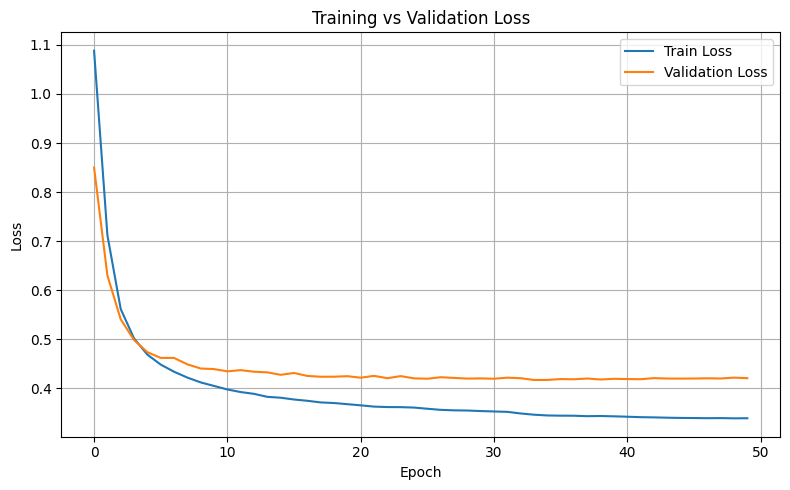

In [12]:
from torch.amp import autocast, GradScaler

device = "cuda" if torch.cuda.is_available() else "cpu"

model = DinoV2Segmentation(num_classes=2).to(device)

train_losses = []
val_losses = []
scaler = GradScaler(enabled=(device == "cuda"))

# partial fine-tuning
for name, p in model.backbone.named_parameters():
    if any(b in name for b in ["blocks.9", "blocks.10", "blocks.11"]):
        p.requires_grad = True
    else:
        p.requires_grad = False

optimizer = optim.Adam(
    filter(lambda p: p.requires_grad, model.parameters()),
    lr=1e-4
)

scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode="min",
    factor=0.5,
    patience=5
)


def validate(model, loader):
    model.eval()
    loss_sum = 0

    with torch.no_grad():
        for images, masks in loader:
            images = images.to(device, non_blocking=True)
            masks  = masks.to(device, non_blocking=True)

            preds = model(images)
            loss  = loss_fn(preds, masks)
            loss_sum += loss.item()

    return loss_sum / len(loader)



from torch.amp import autocast, GradScaler

EPOCHS = 50

for epoch in range(EPOCHS):
    model.train()
    train_loss = 0.0

    for images, masks in train_loader:
        images = images.to(device, non_blocking=True)
        masks  = masks.to(device, non_blocking=True)

        optimizer.zero_grad(set_to_none=True)

        with autocast(device_type="cuda", enabled=(device == "cuda")):
            preds = model(images)
            loss  = loss_fn(preds, masks)

        scaler.scale(loss).backward()
        scaler.unscale_(optimizer)
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)

        scaler.step(optimizer)
        scaler.update()

        train_loss += loss.item()

    train_loss /= len(train_loader)
    val_loss = validate(model, val_loader)

    scheduler.step(val_loss)


    train_losses.append(train_loss)
    val_losses.append(val_loss)

    print(
        f"Epoch {epoch+1:03d}/{EPOCHS} | "
        f"Train: {train_loss:.4f} | "
        f"Val: {val_loss:.4f} | "
        f"LR: {optimizer.param_groups[0]['lr']:.2e}"
    )


plt.figure(figsize=(8, 5))
plt.plot(train_losses, label="Train Loss")
plt.plot(val_losses, label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training vs Validation Loss")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [22]:
def compute_sample_loss(logits, target):
    """
    logits: (1, C, H, W)
    target: (H, W)
    """
    target = target.unsqueeze(0).to(logits.device)
    loss = loss_fn(logits, target)
    return loss.item()

def compute_sample_loss(logits, target):
    """
    logits: (1, C, H, W)
    target: (H, W)
    """
    target = target.unsqueeze(0).to(logits.device)
    loss = loss_fn(logits, target)
    return loss.item()
    
def get_foreground_prob(logits):
    """
    logits: (1, 2, H, W)
    returns: (H, W) foreground probability
    """
    probs = torch.softmax(logits, dim=1)
    return probs[0, 1].cpu().numpy()
def error_map(pred, gt):
    h, w = gt.shape
    err = np.zeros((h, w, 3), dtype=np.uint8)

    err[(pred == 1) & (gt == 1)] = [0, 255, 0]   # TP
    err[(pred == 1) & (gt == 0)] = [255, 0, 0]   # FP
    err[(pred == 0) & (gt == 1)] = [0, 0, 255]   # FN

    return err
    
def denormalize(image):
    """
    image: (3, H, W) torch tensor, ImageNet normalized
    returns: (H, W, 3) numpy image in [0,1]
    """
    mean = torch.tensor([0.485, 0.456, 0.406])[:, None, None]
    std  = torch.tensor([0.229, 0.224, 0.225])[:, None, None]

    img = image.cpu() * std + mean
    img = img.clamp(0, 1)
    return img.permute(1, 2, 0).numpy()

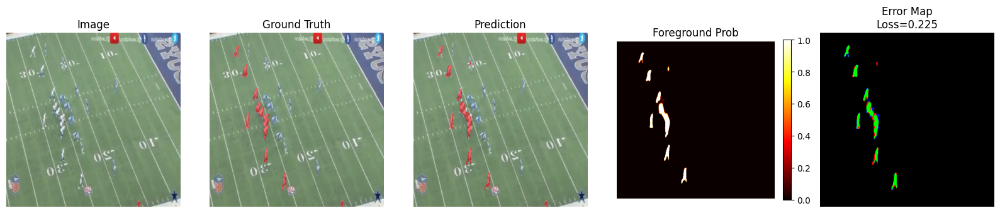

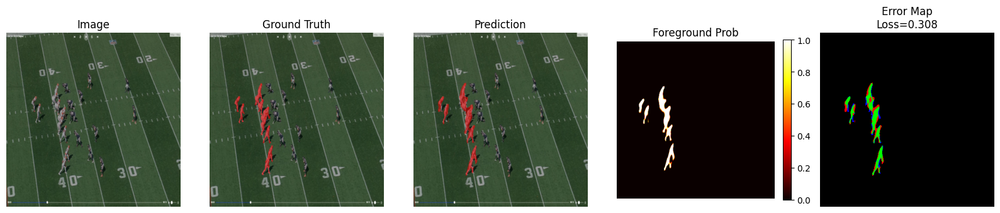

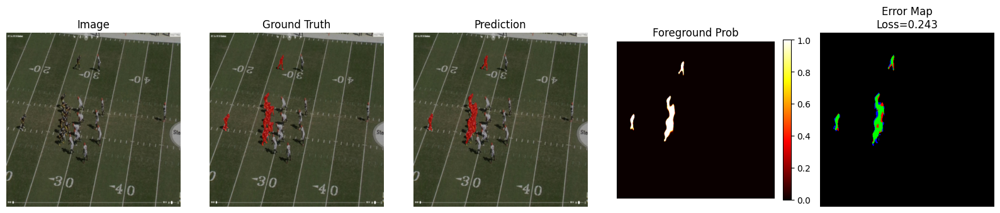

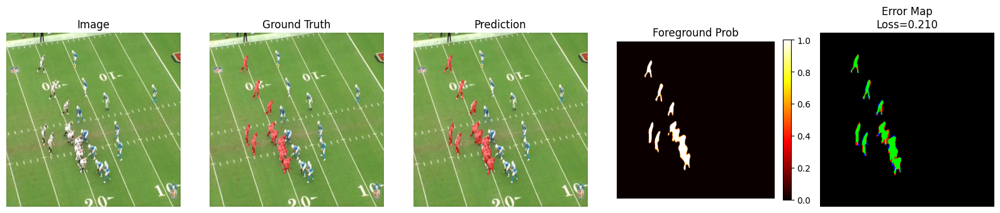

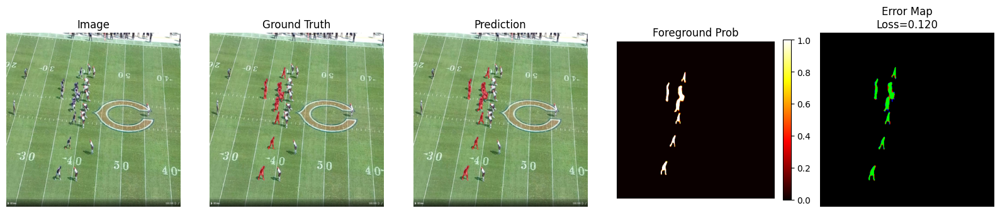

...

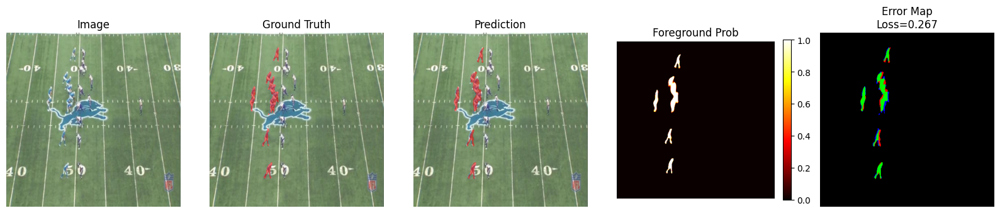

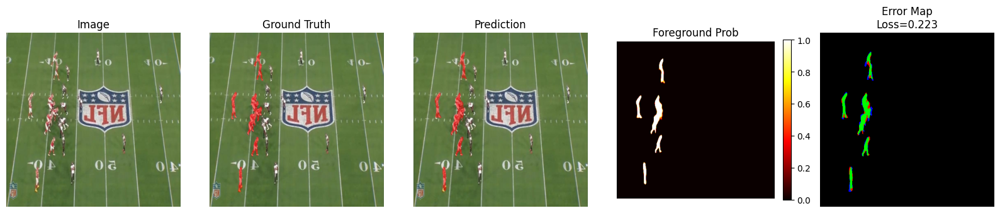

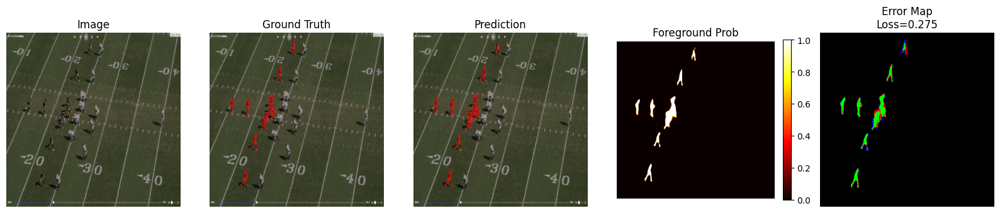

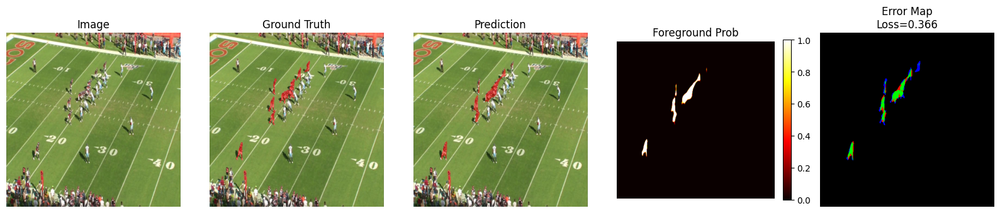

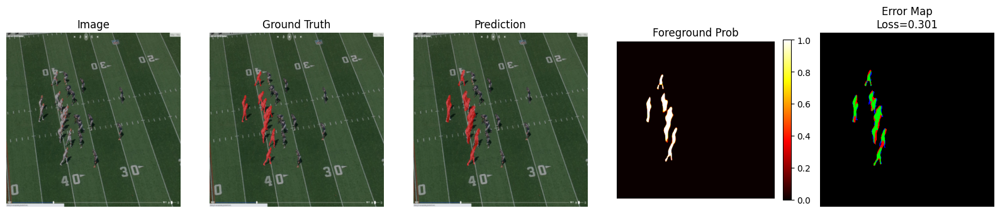

In [23]:
def colorize_binary(mask):

    out = np.zeros((mask.shape[0], mask.shape[1], 3), dtype=np.uint8)
    out[mask == 1] = [255, 0, 0]  # players = red
    return out

def overlay_mask(image, mask, alpha=0.5):

    overlay = image.copy()
    overlay[mask == 1] = (
        (1 - alpha) * overlay[mask == 1] +
        alpha * np.array([1.0, 0.0, 0.0])  # red
    )
    return overlay


def colorize(mask):
    out = np.zeros((*mask.shape, 3), dtype=np.uint8)
    out[mask == 1] = [255, 0, 0]  # players = red
    return out
model.eval()

for i in range(20):
    image, gt = test_set_off[i]

    with torch.no_grad():
        logits = model(image.unsqueeze(0).to(device))
        pred = logits.argmax(1).squeeze().cpu().numpy()
        fg_prob = get_foreground_prob(logits)
        sample_loss = compute_sample_loss(logits, gt)

    image_np = denormalize(image)

    plt.figure(figsize=(16, 4))

    # Original image
    plt.subplot(1, 5, 1)
    plt.imshow(image_np)
    plt.title("Image")
    plt.axis("off")

    # Ground truth overlay
    plt.subplot(1, 5, 2)
    plt.imshow(overlay_mask(image_np, gt.numpy()))
    plt.title("Ground Truth")
    plt.axis("off")

    # Prediction overlay
    plt.subplot(1, 5, 3)
    plt.imshow(overlay_mask(image_np, pred))
    plt.title("Prediction")
    plt.axis("off")

    # Foreground probability
    plt.subplot(1, 5, 4)
    plt.imshow(fg_prob, cmap="hot")
    plt.title("Foreground Prob")
    plt.colorbar(fraction=0.046)
    plt.axis("off")

    # Error map
    plt.subplot(1, 5, 5)
    plt.imshow(error_map(pred, gt.numpy()))
    plt.title(f"Error Map\nLoss={sample_loss:.3f}")
    plt.axis("off")

    plt.tight_layout()
    plt.show()



# Offence Recognition 

In [24]:
class NFLSegmentationDatasetOffence(Dataset):
    def __init__(self, img_dir, mask_dir, img_size=512, augment=False):
        self.img_dir = img_dir
        self.mask_dir = mask_dir
        self.img_size = img_size
        self.augment = augment

        self.samples = [
            (f, f + "_team_mask.png")
            for f in sorted(os.listdir(img_dir))
            if not f.startswith(".")
            and os.path.exists(os.path.join(mask_dir, f + "_team_mask.png"))
        ]

        print(f"Found {len(self.samples)} samples")

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_name, mask_name = self.samples[idx]

        # ─── IMAGE ───────────────────────────────────────────────
        image = Image.open(os.path.join(self.img_dir, img_name)).convert("RGB")
        image = image.resize((self.img_size, self.img_size), Image.BILINEAR)

        # ─── MASK (RGB → BLUE ONLY → BINARY) ─────────────────────
        mask_rgb = Image.open(
            os.path.join(self.mask_dir, mask_name)
        ).convert("RGB")

        mask_rgb = mask_rgb.resize(
            (self.img_size, self.img_size), Image.NEAREST
        )

        mask_np = np.array(mask_rgb)

        # Blue detection (robust to compression)
        blue_mask = (
            (mask_np[:, :, 2] > 150) &   # Blue channel high
            (mask_np[:, :, 0] < 100) &   # Red low
            (mask_np[:, :, 1] < 100)     # Green low
        )

        mask = torch.from_numpy(blue_mask.astype(np.int64))

        # ─── SAFE PHOTOMETRIC AUGMENTATION (IMAGE ONLY) ──────────
        if self.augment:
            if random.random() < 0.7:
                image = TF.adjust_brightness(image, 0.7 + 0.6 * random.random())

            if random.random() < 0.7:
                image = TF.adjust_contrast(image, 0.7 + 0.6 * random.random())

            if random.random() < 0.5:
                image = TF.adjust_gamma(image, 0.8 + 0.4 * random.random())

            if random.random() < 0.4:
                img_np = np.array(image).astype(np.float32)
                noise = np.random.normal(0, 6, img_np.shape)
                image = Image.fromarray(
                    np.clip(img_np + noise, 0, 255).astype(np.uint8)
                )

        image = torch.from_numpy(np.array(image)).permute(2, 0, 1).float() / 255.0
        mean = torch.tensor([0.485, 0.456, 0.406])[:, None, None]
        std  = torch.tensor([0.229, 0.224, 0.225])[:, None, None]
        image = (image - mean) / std

        return image, mask

        
class RepeatDataset(torch.utils.data.Dataset):
    def __init__(self, dataset, repeats=3):
        self.dataset = dataset
        self.repeats = repeats

    def __len__(self):
        return len(self.dataset) * self.repeats

    def __getitem__(self, idx):
        return self.dataset[idx % len(self.dataset)]

In [25]:
# 1. base dataset (no aug)
base_dataset_off = NFLSegmentationDatasetOffence(
    IMG_DIR, MASK_DIR, img_size=448, augment=False
)

# 2. split
N = len(base_dataset_off)
train_size_off = int(0.7 * N)
val_size_off   = int(0.15 * N)
test_size_off  = N - train_size_off - val_size_off

train_set_off, val_set_off, test_set_off = random_split(
    base_dataset_off,
    [train_size_off, val_size_off, test_size_off],
    generator=torch.Generator().manual_seed(42)
)

# 3. augmentation only for training
train_set_off.dataset.augment = True
val_set_off.dataset.augment   = False
test_set_off.dataset.augment  = False

# 4. repeat only training
train_dataset = RepeatDataset(train_set_off, repeats=3)

Found 805 samples


In [26]:
BATCH_SIZE = 2

In [27]:
train_loader_off = DataLoader(train_set_off, batch_size=BATCH_SIZE, shuffle=True, num_workers=0)
val_loader_off   = DataLoader(val_set_off, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)
test_loader_off  = DataLoader(test_set_off, batch_size=1, shuffle=False)

In [34]:
class DinoV2Segmentation_off(nn.Module):
    def __init__(self, num_classes=2):
        super().__init__()
        self.backbone = Dinov2Model.from_pretrained("facebook/dinov2-base")

        self.decoder = nn.Sequential(
            # 32x32
            nn.Conv2d(768, 512, 3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(inplace=True),
        
            nn.Upsample(scale_factor=2, mode="bilinear", align_corners=False),  # 64x64
        
            nn.Conv2d(512, 256, 3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
        
            nn.Upsample(scale_factor=2, mode="bilinear", align_corners=False),  # 128x128
        
            nn.Conv2d(256, 128, 3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
        
            nn.Upsample(scale_factor=2, mode="bilinear", align_corners=False),  # 256x256
        
            nn.Conv2d(128, 64, 3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
        
            nn.Conv2d(64, num_classes, 1)  # 256x256
        )

    def forward(self, x):
        B, _, H, W = x.shape
        feats = self.backbone(pixel_values=x).last_hidden_state[:, 1:, :]
        h = w = int(feats.shape[1] ** 0.5)
        feats = feats.permute(0,2,1).reshape(B, 768, h, w)
        out = self.decoder(feats)
        return nn.functional.interpolate(out, size=(H,W), mode="bilinear", align_corners=False)

In [35]:
class DiceLoss(nn.Module):
    def __init__(self, smooth=1.0):
        super().__init__()
        self.smooth = smooth

    def forward(self, logits, targets):
        probs = torch.softmax(logits, dim=1)[:, 1]  # (B,H,W)
        targets = targets.float()

        dims = (1, 2)
        intersection = (probs * targets).sum(dims)
        union = probs.sum(dims) + targets.sum(dims)

        dice = (2 * intersection + self.smooth) / (union + self.smooth)
        return 1 - dice.mean()


ce_loss   = nn.CrossEntropyLoss()
dice_loss = DiceLoss()


def loss_fn(preds, targets):
    return ce_loss(preds, targets) + dice_loss(preds, targets)

Epoch 001/50 | Train: 1.1093 | Val: 0.9083 | LR: 1.00e-04
Epoch 002/50 | Train: 0.7256 | Val: 0.5842 | LR: 1.00e-04
Epoch 003/50 | Train: 0.4548 | Val: 0.3965 | LR: 1.00e-04
Epoch 004/50 | Train: 0.3240 | Val: 0.3209 | LR: 1.00e-04
Epoch 005/50 | Train: 0.2675 | Val: 0.2764 | LR: 1.00e-04
Epoch 006/50 | Train: 0.2373 | Val: 0.2555 | LR: 1.00e-04
Epoch 007/50 | Train: 0.2171 | Val: 0.2480 | LR: 1.00e-04
Epoch 008/50 | Train: 0.2015 | Val: 0.2406 | LR: 1.00e-04
Epoch 009/50 | Train: 0.1897 | Val: 0.2341 | LR: 1.00e-04
Epoch 010/50 | Train: 0.1794 | Val: 0.2348 | LR: 1.00e-04
Epoch 011/50 | Train: 0.1704 | Val: 0.2299 | LR: 1.00e-04
Epoch 012/50 | Train: 0.1622 | Val: 0.2383 | LR: 1.00e-04
Epoch 013/50 | Train: 0.1573 | Val: 0.2229 | LR: 1.00e-04
Epoch 014/50 | Train: 0.1510 | Val: 0.2234 | LR: 1.00e-04
Epoch 015/50 | Train: 0.1460 | Val: 0.2268 | LR: 1.00e-04
Epoch 016/50 | Train: 0.1419 | Val: 0.2234 | LR: 1.00e-04
Epoch 017/50 | Train: 0.1387 | Val: 0.2239 | LR: 1.00e-04
Epoch 018/50 |

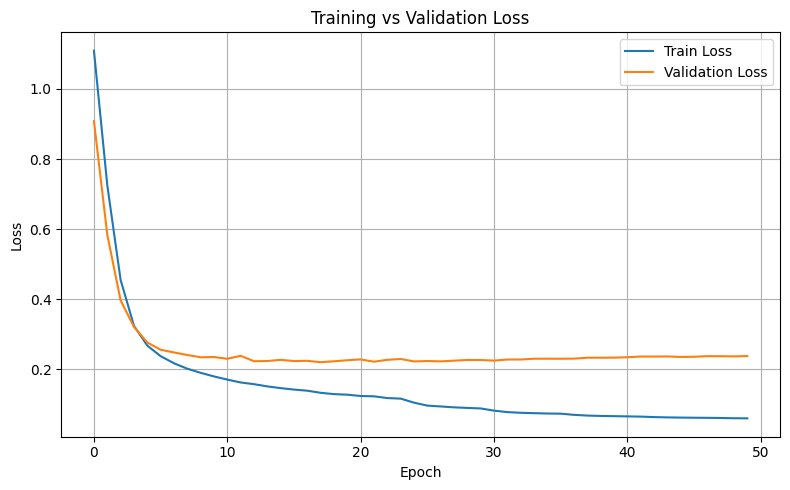

'\nimport torch\nimport torch.nn as nn\nimport torch.optim as optim\nfrom torch.amp import autocast, GradScaler\n\ndevice = "cuda" if torch.cuda.is_available() else "cpu"\n\nmodel = DinoV2Segmentation_off(num_classes=2).to(device)\n\n# ─────────────────────────────────────────────\n# PARTIAL FINE-TUNING (KEEP AS YOU HAD)\n# ─────────────────────────────────────────────\nfor name, p in model.backbone.named_parameters():\n    if any(b in name for b in ["blocks.9", "blocks.10", "blocks.11"]):\n        p.requires_grad = True\n    else:\n        p.requires_grad = False\n\n# ─────────────────────────────────────────────\n# OPTIMIZER: AdamW + separate LRs\n# ─────────────────────────────────────────────\nbackbone_params = []\ndecoder_params  = []\n\nfor name, p in model.named_parameters():\n    if not p.requires_grad:\n        continue\n    if "backbone" in name:\n        backbone_params.append(p)\n    else:\n        decoder_params.append(p)\n\noptimizer = optim.AdamW(\n    [\n        {"param

In [36]:
from torch.amp import autocast, GradScaler

device = "cuda" if torch.cuda.is_available() else "cpu"

model = DinoV2Segmentation_off(num_classes=2).to(device)

train_losses = []
val_losses = []
scaler = GradScaler(enabled=(device == "cuda"))

# partial fine-tuning
for name, p in model.backbone.named_parameters():
    if any(b in name for b in ["blocks.9", "blocks.10", "blocks.11"]):
        p.requires_grad = True
    else:
        p.requires_grad = False

optimizer = optim.Adam(
    filter(lambda p: p.requires_grad, model.parameters()),
    lr=1e-4
)

scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode="min",
    factor=0.5,
    patience=5
)


def validate(model, loader):
    model.eval()
    loss_sum = 0

    with torch.no_grad():
        for images, masks in loader:
            images = images.to(device, non_blocking=True)
            masks  = masks.to(device, non_blocking=True)

            preds = model(images)
            loss  = loss_fn(preds, masks)
            loss_sum += loss.item()

    return loss_sum / len(loader)



from torch.amp import autocast, GradScaler

EPOCHS = 50

for epoch in range(EPOCHS):
    model.train()
    train_loss = 0.0

    for images, masks in train_loader_off:
        images = images.to(device, non_blocking=True)
        masks  = masks.to(device, non_blocking=True)

        optimizer.zero_grad(set_to_none=True)

        with autocast(device_type="cuda", enabled=(device == "cuda")):
            preds = model(images)
            loss  = loss_fn(preds, masks)

        scaler.scale(loss).backward()
        scaler.unscale_(optimizer)
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)

        scaler.step(optimizer)
        scaler.update()

        train_loss += loss.item()

    train_loss /= len(train_loader_off)
    val_loss = validate(model, val_loader_off)

    scheduler.step(val_loss)


    train_losses.append(train_loss)
    val_losses.append(val_loss)

    print(
        f"Epoch {epoch+1:03d}/{EPOCHS} | "
        f"Train: {train_loss:.4f} | "
        f"Val: {val_loss:.4f} | "
        f"LR: {optimizer.param_groups[0]['lr']:.2e}"
    )


plt.figure(figsize=(8, 5))
plt.plot(train_losses, label="Train Loss")
plt.plot(val_losses, label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training vs Validation Loss")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()



'''
import torch
import torch.nn as nn
import torch.optim as optim
from torch.amp import autocast, GradScaler

device = "cuda" if torch.cuda.is_available() else "cpu"

model = DinoV2Segmentation_off(num_classes=2).to(device)

# ─────────────────────────────────────────────
# PARTIAL FINE-TUNING (KEEP AS YOU HAD)
# ─────────────────────────────────────────────
for name, p in model.backbone.named_parameters():
    if any(b in name for b in ["blocks.9", "blocks.10", "blocks.11"]):
        p.requires_grad = True
    else:
        p.requires_grad = False

# ─────────────────────────────────────────────
# OPTIMIZER: AdamW + separate LRs
# ─────────────────────────────────────────────
backbone_params = []
decoder_params  = []

for name, p in model.named_parameters():
    if not p.requires_grad:
        continue
    if "backbone" in name:
        backbone_params.append(p)
    else:
        decoder_params.append(p)

optimizer = optim.AdamW(
    [
        {"params": backbone_params, "lr": 2e-5},
        {"params": decoder_params,  "lr": 1e-4},
    ],
    weight_decay=1e-4
)


warmup_epochs = 5

def warmup_factor(epoch):
    return min(1.0, (epoch + 1) / warmup_epochs)

scheduler = optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode="min",
    factor=0.5,
    patience=5,
    verbose=True
)


scaler = GradScaler(enabled=(device == "cuda"))


@torch.no_grad()
def validate(model, loader):
    model.eval()
    loss_sum = 0.0

    for images, masks in loader:
        images = images.to(device, non_blocking=True)
        masks  = masks.to(device, non_blocking=True)

        with autocast(device_type="cuda", enabled=(device == "cuda")):
            preds = model(images)
            loss  = loss_fn(preds, masks)

        loss_sum += loss.item()

    return loss_sum / len(loader)


EPOCHS = 50
train_losses, val_losses = [], []

for epoch in range(EPOCHS):
    model.train()
    train_loss = 0.0


    wf = warmup_factor(epoch)
    for g in optimizer.param_groups:
        g["lr"] = g["lr"] * wf

    for images, masks in train_loader_off:
        images = images.to(device, non_blocking=True)
        masks  = masks.to(device, non_blocking=True)

        optimizer.zero_grad(set_to_none=True)

        with autocast(device_type="cuda", enabled=(device == "cuda")):
            preds = model(images)
            loss  = loss_fn(preds, masks)

        scaler.scale(loss).backward()
        scaler.unscale_(optimizer)
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)

        scaler.step(optimizer)
        scaler.update()

        train_loss += loss.item()

    train_loss /= len(train_loader_off)
    val_loss = validate(model, val_loader_off)

    scheduler.step(val_loss)

    train_losses.append(train_loss)
    val_losses.append(val_loss)

    print(
        f"Epoch {epoch+1:03d}/{EPOCHS} | "
        f"Train: {train_loss:.4f} | "
        f"Val: {val_loss:.4f} | "
        f"LR backbone: {optimizer.param_groups[0]['lr']:.2e} | "
        f"LR decoder: {optimizer.param_groups[1]['lr']:.2e}"
    )
'''


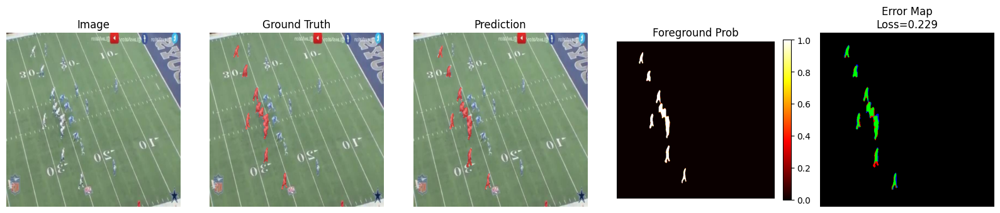

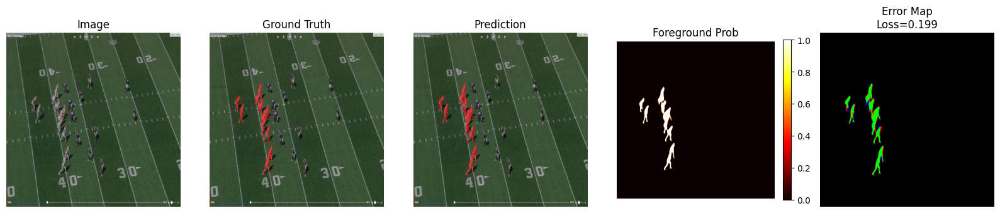

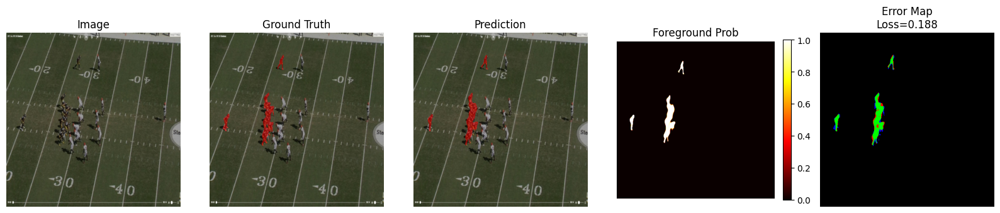

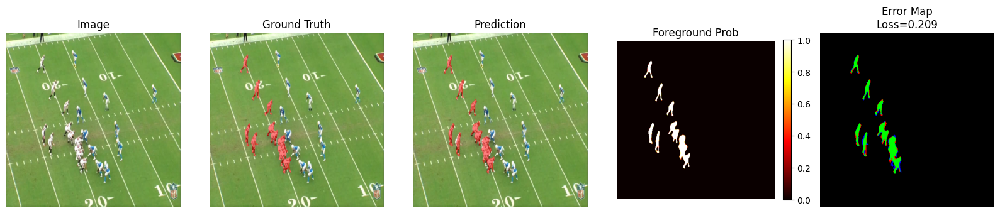

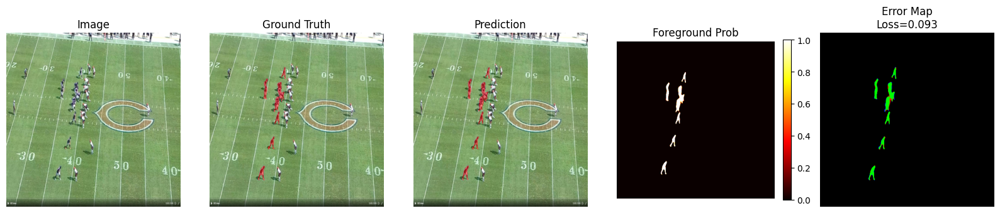

...

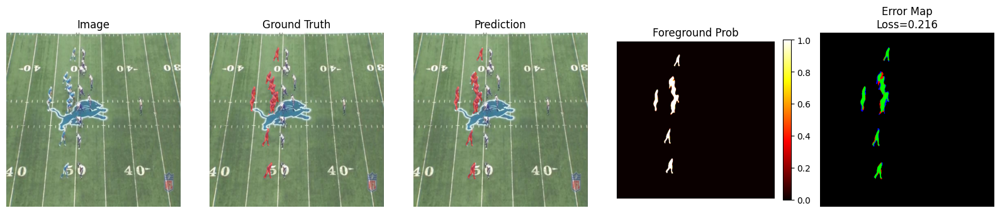

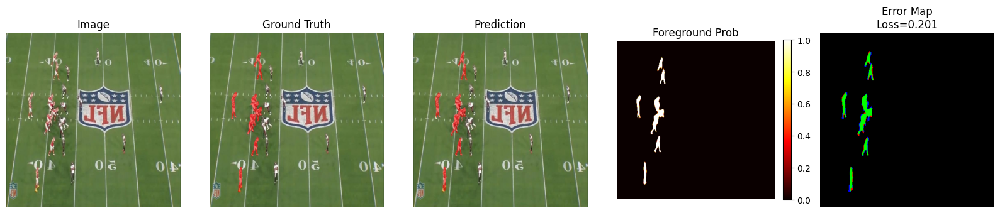

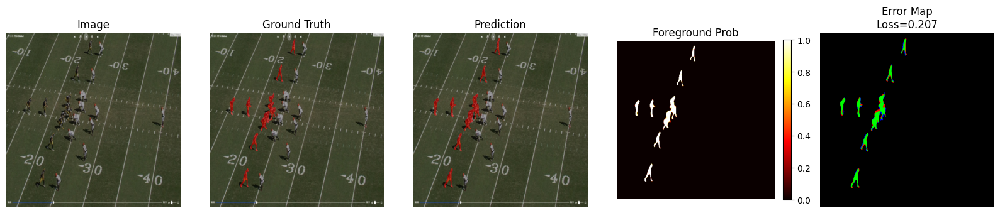

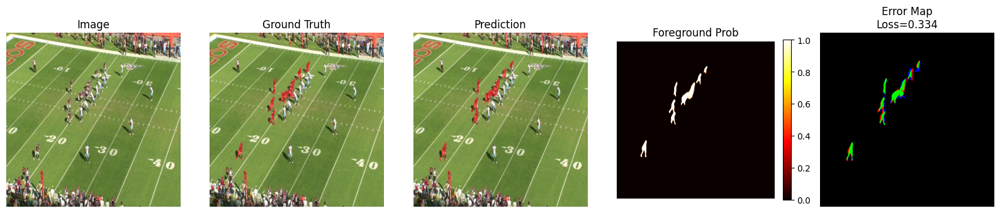

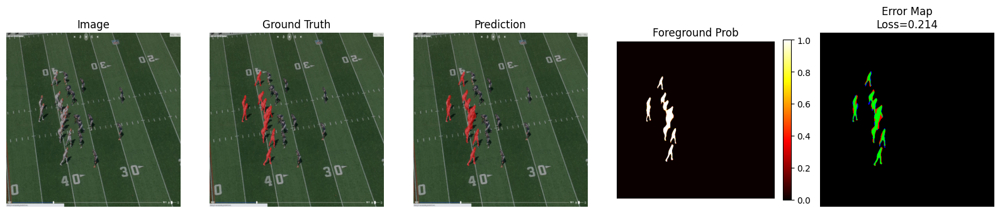

In [39]:
def denormalize(image):
    """
    image: (3, H, W) torch tensor, ImageNet normalized
    returns: (H, W, 3) numpy image in [0,1]
    """
    mean = torch.tensor([0.485, 0.456, 0.406])[:, None, None]
    std  = torch.tensor([0.229, 0.224, 0.225])[:, None, None]

    img = image.cpu() * std + mean
    img = img.clamp(0, 1)
    return img.permute(1, 2, 0).numpy()

model.eval()

for i in range(20):
    image, gt = test_set_off[i]

    with torch.no_grad():
        logits = model(image.unsqueeze(0).to(device))
        pred = logits.argmax(1).squeeze().cpu().numpy()
        fg_prob = get_foreground_prob(logits)
        sample_loss = compute_sample_loss(logits, gt)

    image_np = denormalize(image)

    plt.figure(figsize=(16, 4))

    # Original image
    plt.subplot(1, 5, 1)
    plt.imshow(image_np)
    plt.title("Image")
    plt.axis("off")

    # Ground truth overlay
    plt.subplot(1, 5, 2)
    plt.imshow(overlay_mask(image_np, gt.numpy()))
    plt.title("Ground Truth")
    plt.axis("off")

    # Prediction overlay
    plt.subplot(1, 5, 3)
    plt.imshow(overlay_mask(image_np, pred))
    plt.title("Prediction")
    plt.axis("off")

    # Foreground probability
    plt.subplot(1, 5, 4)
    plt.imshow(fg_prob, cmap="hot")
    plt.title("Foreground Prob")
    plt.colorbar(fraction=0.046)
    plt.axis("off")

    # Error map
    plt.subplot(1, 5, 5)
    plt.imshow(error_map(pred, gt.numpy()))
    plt.title(f"Error Map\nLoss={sample_loss:.3f}")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

torch.save(model.state_dict(), "/pfs/data6/home/st/st_us-053000/st_st195720/Object_Segmentation_NFL/dinoback_model_weights.pth")

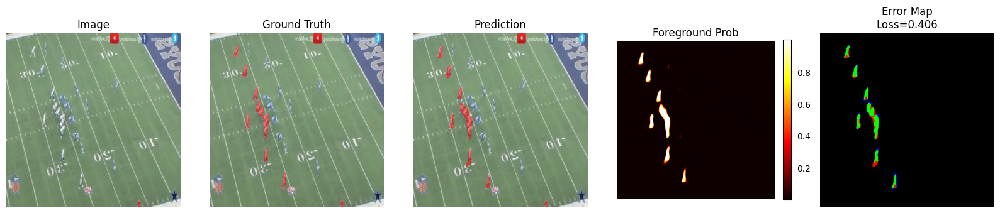

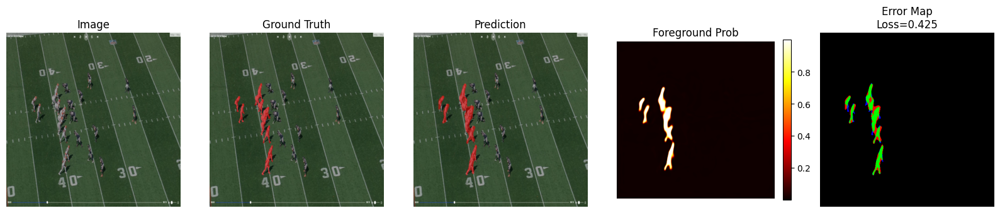

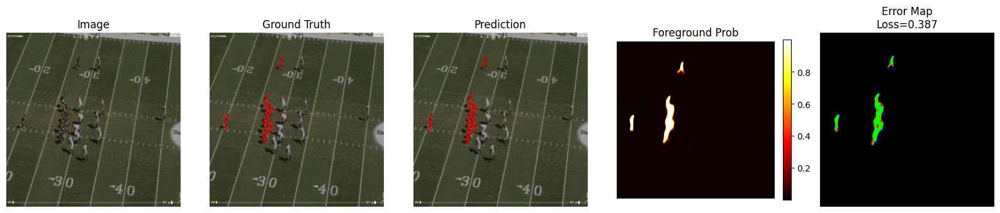

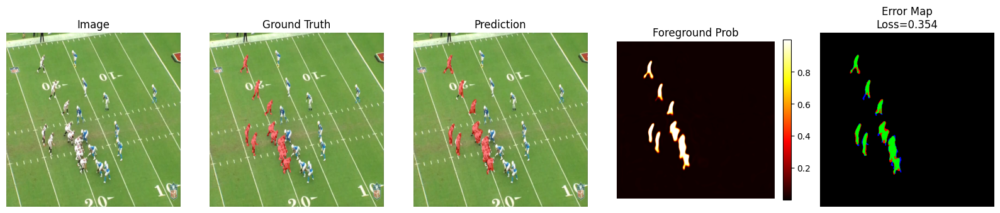

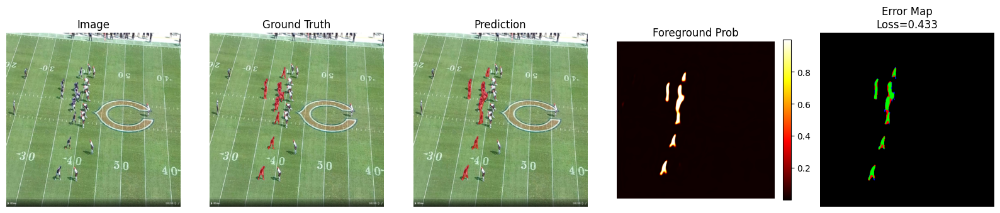

...

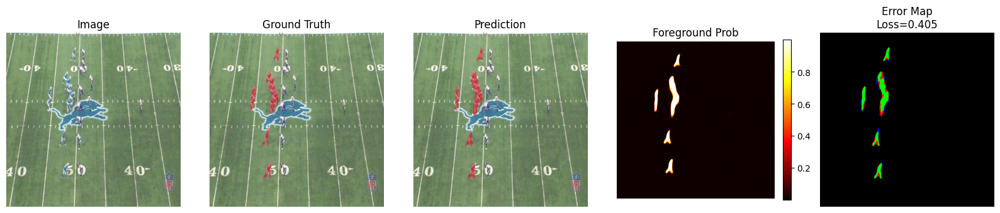

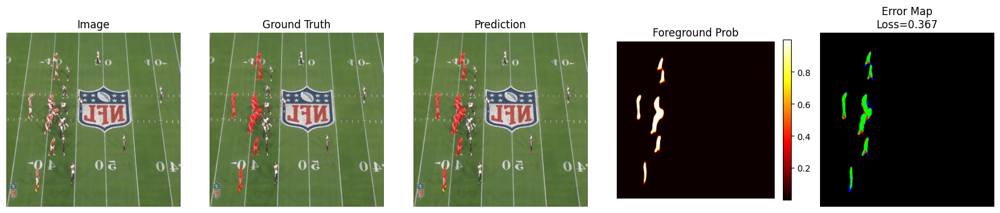

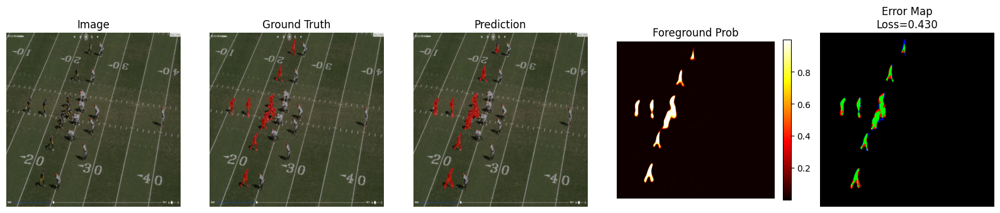

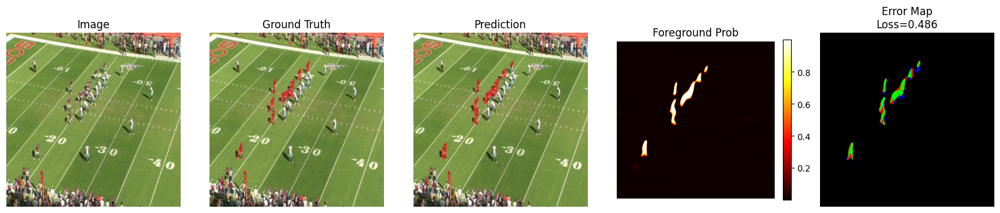

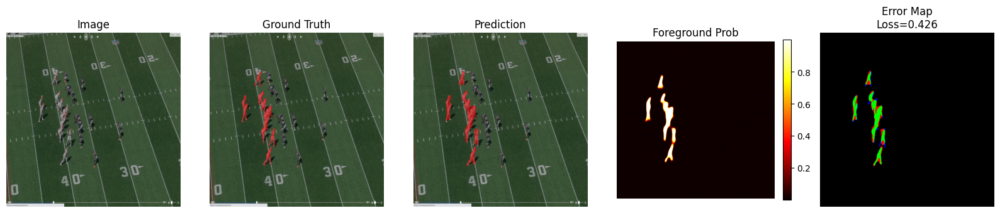

In [62]:
IMG_DIR = "/pfs/data6/home/st/st_us-053000/st_st195720/Object_Segmentation_NFL/Team_masks2/images"
MASK_DIR = "/pfs/data6/home/st/st_us-053000/st_st195720/Object_Segmentation_NFL/Team_masks2/all_masks"

IMG_SIZE = 560
BATCH_SIZE = 2
EPOCHS = 30
LR = 1e-3
NUM_CLASSES = 3 
SEED = 42

In [42]:
images_dir = Path("/pfs/data6/home/st/st_us-053000/st_st195720/Object_Segmentation_NFL/Team_masks2/all_masks")

image_paths = list(images_dir.glob("*.jpg")) + \
              list(images_dir.glob("*.png")) + \
              list(images_dir.glob("*.jpeg"))

print(len(image_paths))
print(image_paths[:5])


805
[PosixPath('/pfs/data6/home/st/st_us-053000/st_st195720/Object_Segmentation_NFL/Team_masks2/all_masks/58162_000514_Sideline_frame45_jpg.rf.d4f1cf868bfc4f79d9460cdd0fd9ea00.jpg_team_mask.png'), PosixPath('/pfs/data6/home/st/st_us-053000/st_st195720/Object_Segmentation_NFL/Team_masks2/all_masks/57549_002523_Sideline_frame152_jpg.rf.6337d003e10769148c54fa4cf216b5db.jpg_team_mask.png'), PosixPath('/pfs/data6/home/st/st_us-053000/st_st195720/Object_Segmentation_NFL/Team_masks2/all_masks/57735_000430_Sideline_frame72_jpg.rf.230263c13f5cc94278acf2f2b10326df.jpg_team_mask.png'), PosixPath('/pfs/data6/home/st/st_us-053000/st_st195720/Object_Segmentation_NFL/Team_masks2/all_masks/Capture160_PNG_jpg.rf.1afd4acd42b3ab2f001b615eee547b67.jpg_team_mask.png'), PosixPath('/pfs/data6/home/st/st_us-053000/st_st195720/Object_Segmentation_NFL/Team_masks2/all_masks/Capture171_PNG_jpg.rf.1c9b3a01932b8704e1434e186ba38c2d.jpg_team_mask.png')]


In [44]:
np.array(Image.open(image_paths[0])).open

AttributeError: 'numpy.ndarray' object has no attribute 'open'